In [51]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb
from concurrent.futures import ThreadPoolExecutor, as_completed
import dask.dataframe as dd
import sys
import glob
import os
from Bio.Seq import Seq

sys.path.append("../../scripts")
%aimport initial_map
%aimport map_refiner
%aimport complexity
%aimport finder
%aimport preprocess
%aimport complexity
%aimport plotting
%aimport umi_deduplicate

from tqdm import tqdm  # progress bar

# Control variables

In [21]:
# UPDATE list of files and output location
AD_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a*")
RT_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/r*")
output_path = "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat" # May need to change to your directory due to writing permissions

# Change below as needed to update barcode info, csv path to final step1 map, and desired output directory


step1_ADBC2 = finder.Barcode(name = "ADBC2",
                       preceder = "TATGCTAT",
                       post = "GGCCGGCCG",
                       length = 6)

step1_HawkBCs = finder.Barcode(name = "HawkBCs",
                       preceder = "TAGC",
                       post = "CTCGAGA",
                       length = 9)

step1_RTBC = finder.Barcode(name = "RTBC",
                       preceder = "GCCCC",
                       post = "GCGG",
                       length = 16)

# Step 1 map
step1_csv = "../../output/NKX2-2_whitelist_concat_density_step1_map.csv"  # Step 1 map I made with error correcting 

In [5]:

# PReviously using wrong below
# step1_ADBC2 = finder.Barcode(name = "ADBC2",
#                        preceder = "TGCTAT",
#                        post = "GGCCGGCC",
#                        length = 6)

# # Example DNA sequence
# seq = Seq("GCTA")  # includes ambiguous bases

# # Reverse complement
# rev_comp = seq.reverse_complement()

# print(rev_comp)  # Output: YRNACGGCAT

# From CC (Need to take rc to work with my code)

# ADBC2
# bc2_pre="CGGCCGGCC", 
# bc2_post="ATAGCATA", 

# Hawk
# bc1_pre="TCTCGAG", 
# bc1_post="GCTA"):


# pre: CCGC
# post: GGGGC


# First, AD analysis

In [23]:
db_path = os.path.join(output_path, "NKX2-2_CC_UMI_whitelisted_concat.db")

In [25]:
AD_objects = [step1_ADBC2, step1_HawkBCs]

In [10]:
complex_AD_results = []
simple_AD_results = []

a2_RNA_ADBC_S18
/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18
Reading 1 FASTQ/TXT file(s)...
Done in 1.67 seconds.

Reverse complement of sequences...
Done in 1.57 seconds.

Extracting 2 barcodes...
TATGCTAT(.*)GGCCGGCCG
TAGC(.*)CTCGAGA
Done in 0.74 seconds.

Extracting UMIs (12 bases)...
Done in 0.14 seconds.

Done in 0.95 seconds.

Mapping complete.
refining
Base prefix (stable across descriptors): umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.63 seconds.


=== Running error correction step on umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality ===

=== Applying whitelist for umi_a2_RNA_ADBC_S18 ===
Generating FASTQ: /global/scratch/projects/fc_mvs

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 244
Done in 0.18 seconds.

Whitelist application complete for umi_a2_RNA_ADBC_S18 at umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_error_corrected
Done in 14.43 seconds.

Done.
Saved loss summary table as 'umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output

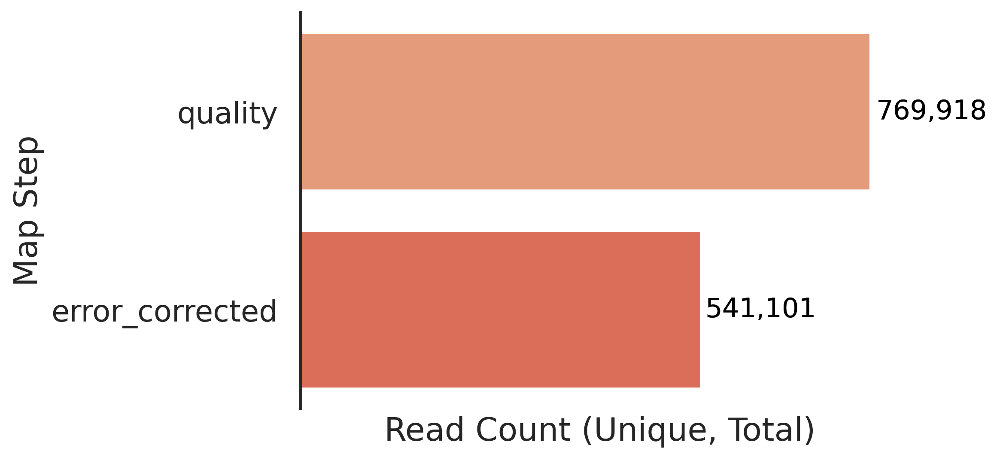

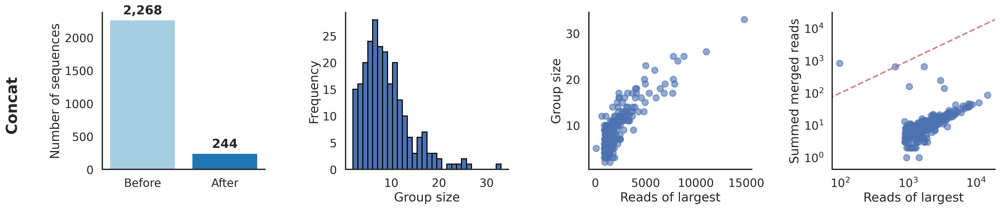

Done in 2.09 seconds.

244
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq (541101 reads)...


Writing FASTQ: 100%|██████████| 541101/541101 [00:00<00:00, 2329328.98it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq
Done in 0.53 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_

Done in 1.37 seconds.

Aligning .FASTQ to reference .FA ...


541101 reads; of these:
  541101 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    541101 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_deduplicated.bam
# job started at Tue Nov 11 17:42:56 2025 on n0083.savio3 -- 8bf6441a-ffc0-490b-bd48-1a9627ee9d09
# pid: 1502642, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 61
Done in 0.18 seconds.

Whitelist application complete for umi_a7_RNA_ADBC_S23 at umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_error_corrected
Done in 11.98 seconds.

Done.
Saved loss summary table as 'umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_loss_summary'
Done in 0.02 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/

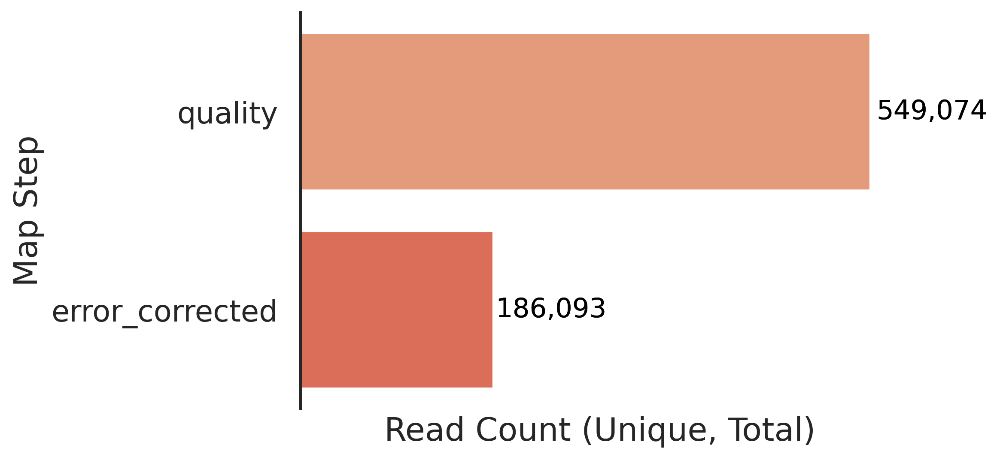

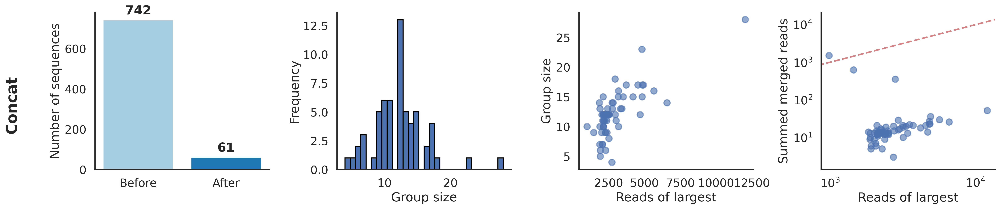

Done in 1.87 seconds.

61
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq (186093 reads)...


Writing FASTQ: 100%|██████████| 186093/186093 [00:00<00:00, 2074676.42it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq
Done in 0.19 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_

Done in 1.03 seconds.

Aligning .FASTQ to reference .FA ...


186093 reads; of these:
  186093 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    186093 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...
Indexing BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_deduplicated.bam
# job started at Tue Nov 11 17:43:56 2025 on n0083.savio3 -- 4ec973f0-a64c-41c2-98d4-c33c64fa3ffb
# pid: 1502909, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 574
Done in 0.26 seconds.

Whitelist application complete for umi_a1_RNA_ADBC_S17 at umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_error_corrected
Done in 12.65 seconds.

Done.
Saved loss summary table as 'umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output

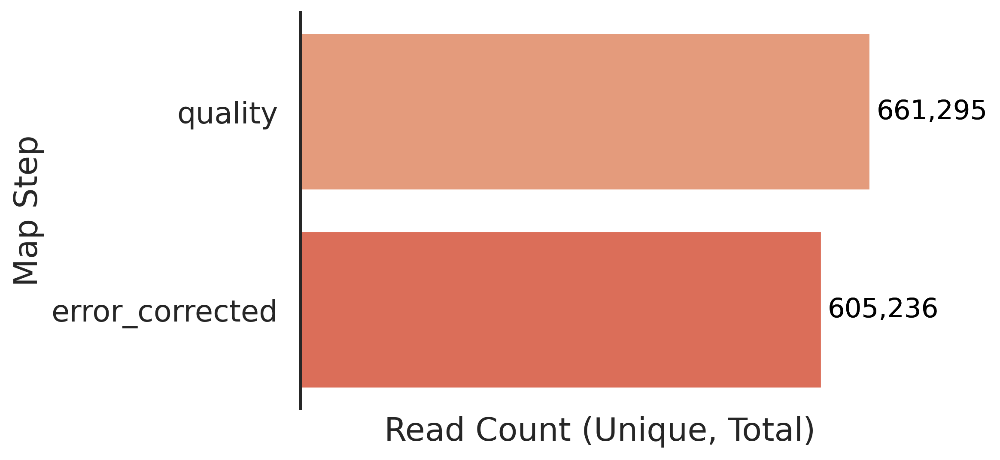

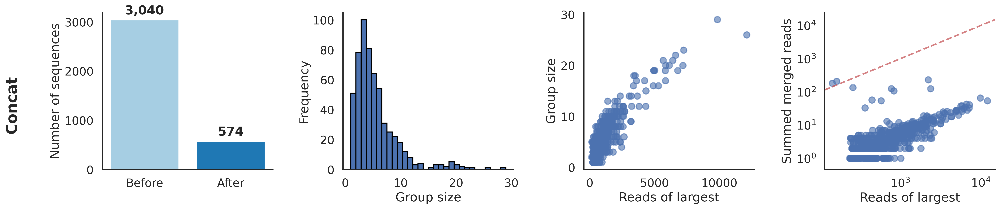

Done in 2.24 seconds.

574
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq (605236 reads)...


Writing FASTQ: 100%|██████████| 605236/605236 [00:00<00:00, 2352189.23it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq
Done in 0.59 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_

Done in 0.89 seconds.

Aligning .FASTQ to reference .FA ...


605236 reads; of these:
  605236 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    605236 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_deduplicated.bam
# job started at Tue Nov 11 17:44:38 2025 on n0083.savio3 -- b3c28299-6e89-4f93-be67-833f569d9e3c
# pid: 1503166, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 326
Done in 0.16 seconds.

Whitelist application complete for umi_a3_RNA_ADBC_S19 at umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_error_corrected
Done in 13.45 seconds.

Done.
Saved loss summary table as 'umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output

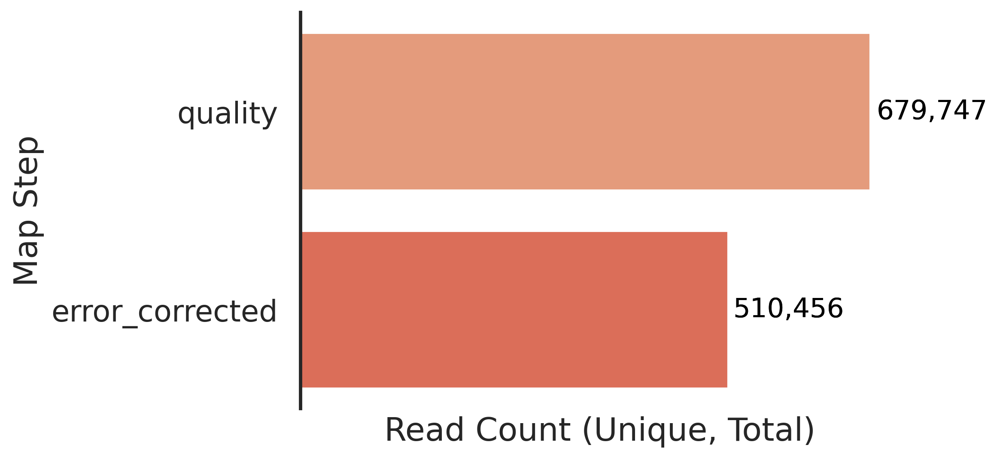

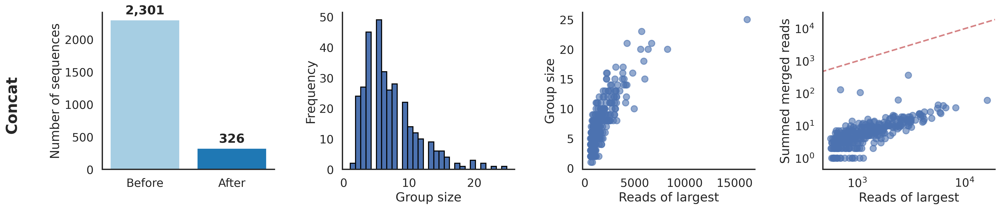

Done in 1.96 seconds.

326
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq (510456 reads)...


Writing FASTQ: 100%|██████████| 510456/510456 [00:00<00:00, 2288655.69it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq
Done in 0.50 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_

Done in 0.93 seconds.

Aligning .FASTQ to reference .FA ...


510456 reads; of these:
  510456 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    510456 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_deduplicated.bam
# job started at Tue Nov 11 17:45:36 2025 on n0083.savio3 -- e5fb4e56-c7f7-41d2-8353-f258a9301ca8
# pid: 1503438, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 281
Done in 0.20 seconds.

Whitelist application complete for umi_a6_RNA_ADBC_S22 at umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_error_corrected
Done in 11.86 seconds.

Done.
Saved loss summary table as 'umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output

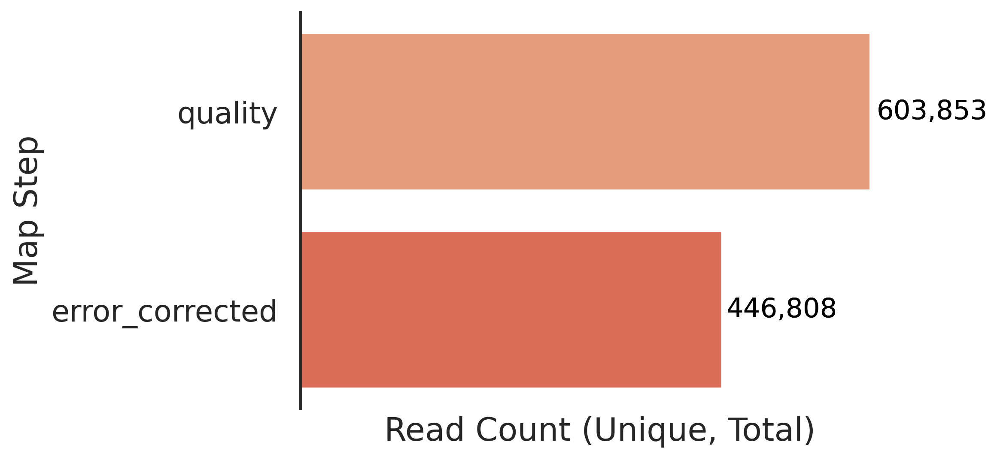

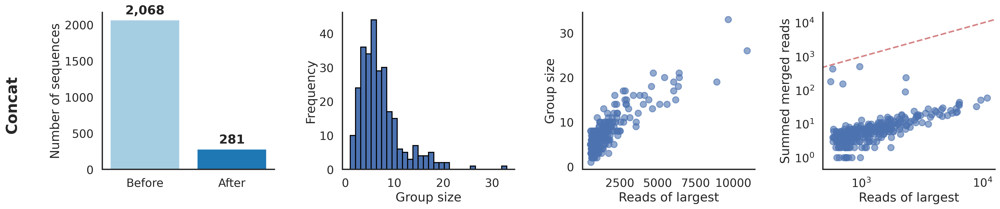

Done in 1.94 seconds.

281
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq (446808 reads)...


Writing FASTQ: 100%|██████████| 446808/446808 [00:00<00:00, 2250714.69it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq
Done in 0.44 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_

Done in 0.82 seconds.

Aligning .FASTQ to reference .FA ...


446808 reads; of these:
  446808 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    446808 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_deduplicated.bam
# job started at Tue Nov 11 17:46:29 2025 on n0083.savio3 -- 56400642-f4cc-42ae-ba52-e89ddec117eb
# pid: 1503679, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 340
Done in 0.22 seconds.

Whitelist application complete for umi_a4_RNA_ADBC_S20 at umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_error_corrected
Done in 12.72 seconds.

Done.
Saved loss summary table as 'umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output

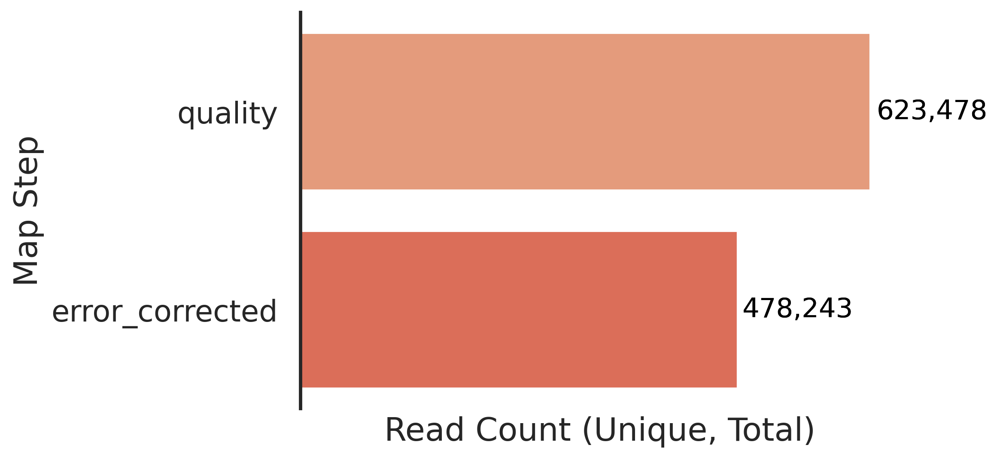

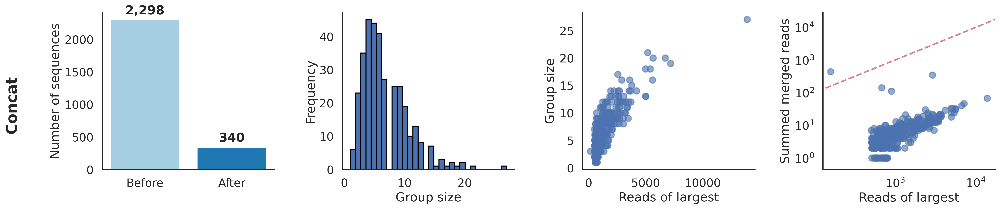

Done in 1.98 seconds.

340
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq (478243 reads)...


Writing FASTQ: 100%|██████████| 478243/478243 [00:00<00:00, 2292940.59it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq
Done in 0.47 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_

Done in 1.02 seconds.

Aligning .FASTQ to reference .FA ...


478243 reads; of these:
  478243 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    478243 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_deduplicated.bam
# job started at Tue Nov 11 17:47:21 2025 on n0083.savio3 -- fdd17e28-889f-4033-a317-f8e612dd24b8
# pid: 1503934, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 62
Done in 0.31 seconds.

Whitelist application complete for umi_a8_RNA_ADBC_S24 at umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_error_corrected
Done in 12.32 seconds.

Done.
Saved loss summary table as 'umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/

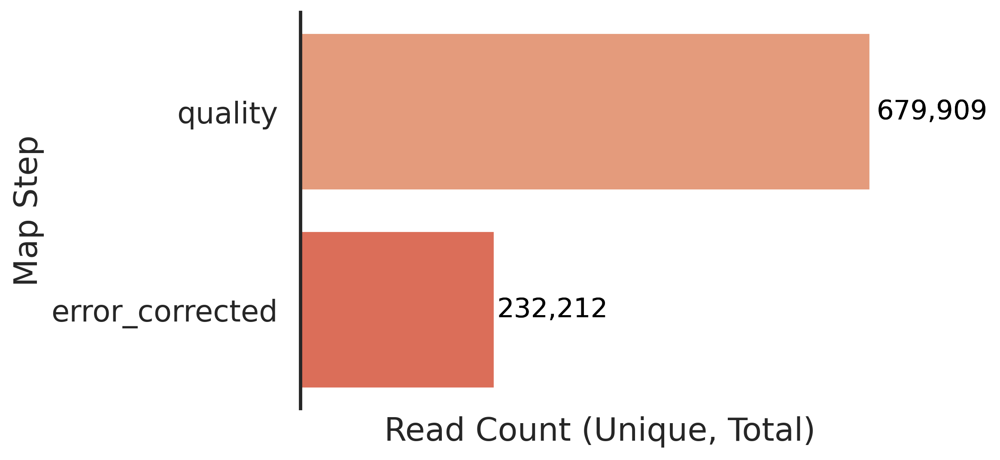

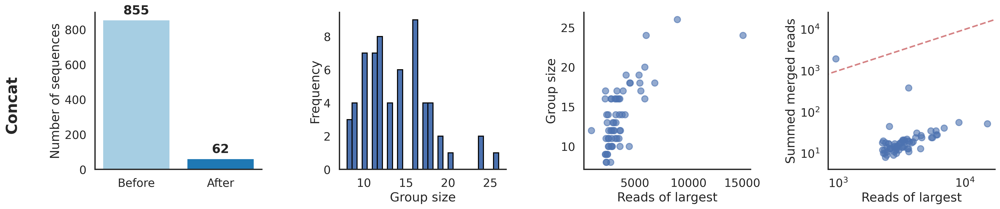

Done in 2.21 seconds.

62
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq (232212 reads)...


Writing FASTQ: 100%|██████████| 232212/232212 [00:00<00:00, 2114338.08it/s]

FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq
Done in 0.24 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index



Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC

Done in 0.92 seconds.

Aligning .FASTQ to reference .FA ...


232212 reads; of these:
  232212 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    232212 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_deduplicated.bam
# job started at Tue Nov 11 17:48:10 2025 on n0083.savio3 -- 3dd827d2-30a3-4a09-89bb-7dcb0d1c209d
# pid: 1504188, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 18
Done in 0.15 seconds.

Whitelist application complete for umi_a5_RNA_ADBC_S21 at umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_error_corrected
Done in 12.66 seconds.

Done.
Saved loss summary table as 'umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/

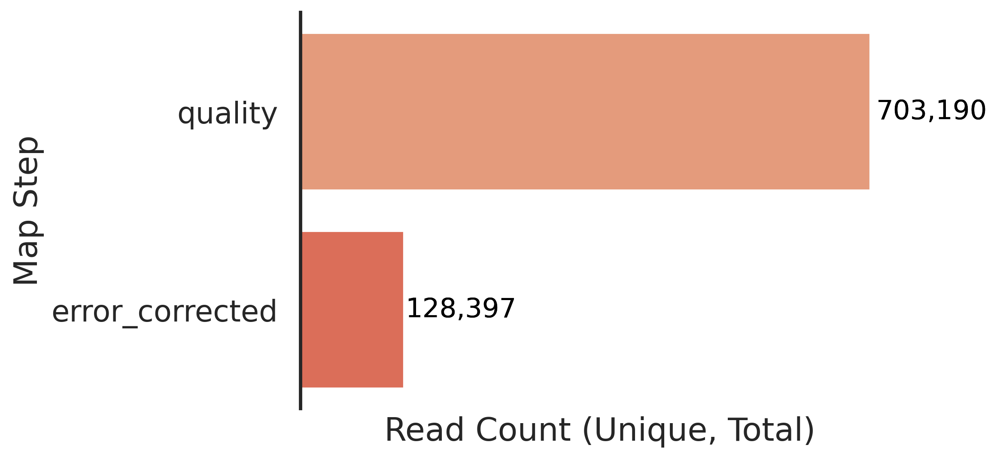

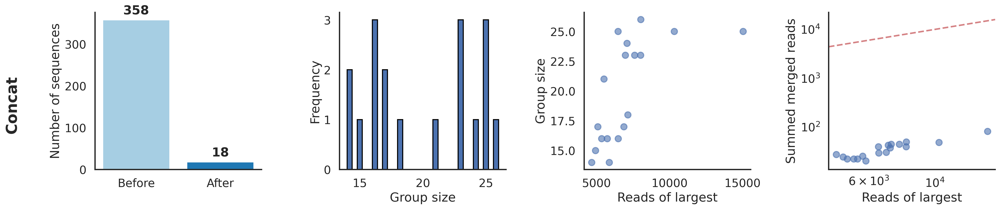

Done in 1.81 seconds.

18
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq (128397 reads)...


Writing FASTQ: 100%|██████████| 128397/128397 [00:00<00:00, 1952016.77it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq
Done in 0.14 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_

Done in 0.98 seconds.

Aligning .FASTQ to reference .FA ...


128397 reads; of these:
  128397 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    128397 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_deduplicated.bam
# job started at Tue Nov 11 17:48:55 2025 on n0083.savio3 -- 34a36317-f601-427a-8b70-f0ec26422b80
# pid: 1504452, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

In [16]:
for file_path in AD_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Get the file naeme to use for output
    umi_path = os.path.join(output_path, f"umi_{name_only}")
    print(umi_path)

    # Extract UMIs and barcodes from reads
    umi_mapper = initial_map.InitialMapper(db_path = db_path,
                                       step_name = f"umi_{name_only}", 
                                       seq_file = file_path,
                                       design_file_path = None,
                                       bc_objects = AD_objects,
                                       reverse_complement = True,
                                       umi_length = 12)
    umi_mapper.create_map()

    print("refining")
    # Only keep barcodes of correct length, then error correct
    refiner = map_refiner.MapRefiner(db_path = db_path,
                                        bc_objects=AD_objects,
                                        column_pairs = [],
                                        reads_threshold = 1,
                                        map_order = ['quality', 'error_corrected'],
                                        step_name=f"umi_{name_only}", 
                                        descriptor = "",
                                    output_figures_path = umi_path)
    refiner.refine_map_from_db()
    refiner.plot_loss()
    refiner.plot_error_correction()
    error_corrected = refiner.get_map_df('error_corrected')
    print(len(error_corrected[["ADBC2", "HawkBCs"]].drop_duplicates()))
    
    # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = AD_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    deduplicator.run_both_deduplications()

    # Collect results
    one_file_complex_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_directional_umi_counts.tsv"), sep = "\t")
    one_file_complex_results["name"] = name_only
    complex_AD_results.append(one_file_complex_results)

    one_file_simple_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_simple_umi_counts.tsv"), sep = "\t")
    one_file_simple_results["name"] = name_only
    simple_AD_results.append(one_file_simple_results)

In [17]:
all_complex_AD_results_df = pd.concat(complex_AD_results)
all_complex_AD_results_df = all_complex_AD_results_df.rename(columns = {"count" : "AD_umi_count", "gene" : "ADBC_concat"})
all_complex_AD_results_df["number"] = all_complex_AD_results_df["name"].str[1]
all_complex_AD_results_df

,ADBC_concat,AD_umi_count,name,number
0,TAACCACAGATATGG,987,a2_RNA_ADBC_S18,2
1,CGCAATCATGTGGTT,1462,a2_RNA_ADBC_S18,2
2,ATGCCAACCTGCCTA,1732,a2_RNA_ADBC_S18,2
3,ACTATTCATTCCAAG,4002,a2_RNA_ADBC_S18,2
4,CAGAAAAGTCCAGTT,1648,a2_RNA_ADBC_S18,2
...,...,...,...,...
13,ACATCACAACGCTTC,5803,a5_RNA_ADBC_S21,5
14,AGACTACACAACTTC,5912,a5_RNA_ADBC_S21,5
15,ACGACACAAGGAACA,4176,a5_RNA_ADBC_S21,5
16,AAAGTTCATGTTGCC,4826,a5_RNA_ADBC_S21,5


In [18]:
all_complex_AD_results_df["name"].value_counts()

name
a1_RNA_ADBC_S17    574
a2_RNA_ADBC_S18    488
a4_RNA_ADBC_S20    340
a3_RNA_ADBC_S19    326
a6_RNA_ADBC_S22    281
a7_RNA_ADBC_S23    122
a8_RNA_ADBC_S24     62
a5_RNA_ADBC_S21     18
Name: count, dtype: int64

In [19]:
all_complex_AD_results_df.to_csv(os.path.join(output_path, f"all_complex_AD_results.csv"))

In [20]:
all_simple_AD_results_df = pd.concat(simple_AD_results)
all_simple_AD_results_df = all_simple_AD_results_df.rename(columns = {"count" : "AD_umi_count"})
all_simple_AD_results_df["ADBC_concat"] = all_simple_AD_results_df["ADBC2"] + all_simple_AD_results_df["HawkBCs"]
all_simple_AD_results_df["number"] = all_simple_AD_results_df["name"].str[1]
all_simple_AD_results_df

,ADBC2,HawkBCs,AD_umi_count,name,ADBC_concat,number
0,GGTTAT,CACAACTTC,11934,a2_RNA_ADBC_S18,GGTTATCACAACTTC,2
1,CCATAA,CACCGATTG,8914,a2_RNA_ADBC_S18,CCATAACACCGATTG,2
2,GCCTGT,CACAACTTC,7063,a2_RNA_ADBC_S18,GCCTGTCACAACTTC,2
3,AGACTA,CACAACTTC,6691,a2_RNA_ADBC_S18,AGACTACACAACTTC,2
4,CGAGTC,CACAACTTC,6324,a2_RNA_ADBC_S18,CGAGTCCACAACTTC,2
...,...,...,...,...,...,...
13,TGATAA,CAGACAGCA,4106,a5_RNA_ADBC_S21,TGATAACAGACAGCA,5
14,CAACGG,CAAGGAACA,3939,a5_RNA_ADBC_S21,CAACGGCAAGGAACA,5
15,ACAAGC,CAACAGTGC,3741,a5_RNA_ADBC_S21,ACAAGCCAACAGTGC,5
16,TATTGC,CAACGCTTC,3598,a5_RNA_ADBC_S21,TATTGCCAACGCTTC,5


In [21]:
all_simple_AD_results_df.to_csv(os.path.join(output_path, f"all_simple_AD_results.csv"))

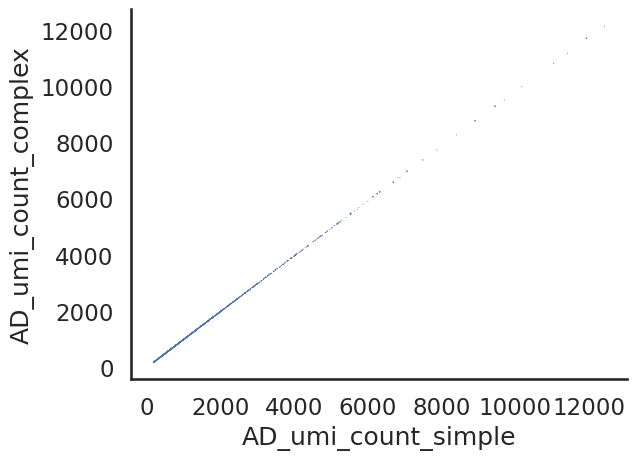

In [22]:
# Both simple and complex counts are roughly y = x which checks out!
AD_results_merged = pd.merge(all_complex_AD_results_df, all_simple_AD_results_df, on = ["ADBC_concat", "name", "number"],suffixes = ("_complex", "_simple"))
sns.scatterplot(data = AD_results_merged, x = "AD_umi_count_simple", y = "AD_umi_count_complex", s  = 0.5, edgecolor = 'none')
sns.despine()
plt.savefig(os.path.join(output_path, f"AD_umi_count_comparison.png"), bbox_inches='tight')

In [23]:
AD_results_merged["name"].value_counts()

name
a2_RNA_ADBC_S18    976
a1_RNA_ADBC_S17    574
a4_RNA_ADBC_S20    340
a3_RNA_ADBC_S19    326
a6_RNA_ADBC_S22    281
a7_RNA_ADBC_S23    244
a8_RNA_ADBC_S24     62
a5_RNA_ADBC_S21     18
Name: count, dtype: int64

# Next, RPTR analysis

In [26]:
RTBC_objects = [step1_RTBC]

In [15]:
complex_RPTR_results = []
simple_RPTR_results = []

r2_RNA_RTBC_S26
/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26
Reading 1 FASTQ/TXT file(s)...
Done in 1.87 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.22 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 0.40 seconds.

Extracting UMIs (12 bases)...
Done in 0.28 seconds.

Done in 0.49 seconds.

Mapping complete.
Base prefix (stable across descriptors): umi_r2_RNA_RTBC_S26_RTBC_
Full prefix for this instance: umi_r2_RNA_RTBC_S26_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_r2_RNA_RTBC_S26_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.48 seconds.


=== Running error correction step on umi_r2_RNA_RTBC_S26_RTBC_quality ===

=== Applying whitelist for umi_r2_RNA_RTBC_S26 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted.fastq
Wrote 871037 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/um

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 460
Done in 0.17 seconds.

Whitelist application complete for umi_r2_RNA_RTBC_S26 at umi_r2_RNA_RTBC_S26_RTBC_error_corrected
Done in 14.36 seconds.

Done.
Saved loss summary table as 'umi_r2_RNA_RTBC_S26_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_

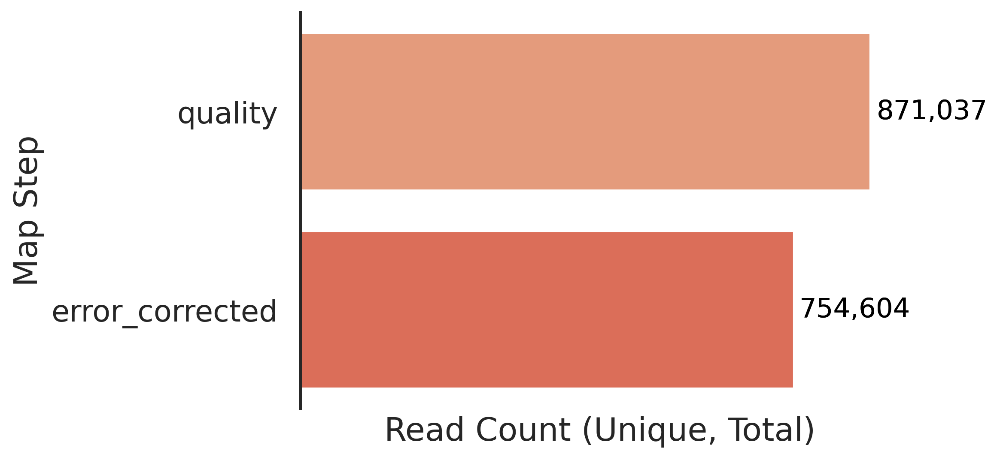

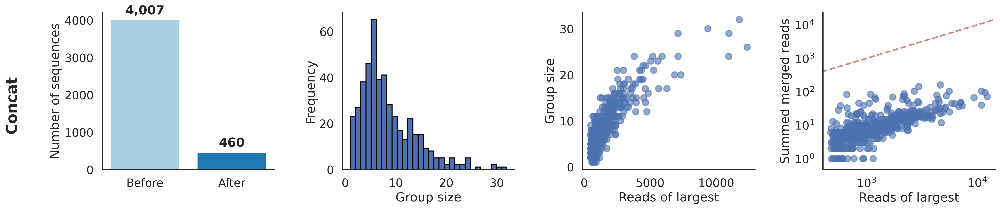

Done in 2.08 seconds.

460
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq (754604 reads)...


Writing FASTQ: 100%|██████████| 754604/754604 [00:00<00:00, 2219280.92it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq
Done in 0.77 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r2_RNA_RTBC_S26_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_

Done in 1.17 seconds.

Aligning .FASTQ to reference .FA ...


754604 reads; of these:
  754604 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    754604 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_deduplicated.bam
# job started at Tue Nov 11 17:53:49 2025 on n0083.savio3 -- 22b4f069-eacb-45b5-99c2-250836678183
# pid: 1505150, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.16 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 0.42 seconds.

Extracting UMIs (12 bases)...
Done in 0.22 seconds.

Done in 0.45 seconds.

Mapping complete.
Base prefix (stable across descriptors): umi_r8_RNA_RTBC_S32_RTBC_
Full prefix for this instance: umi_r8_RNA_RTBC_S32_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_r8_RNA_RTBC_S32_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.49 seconds.


=== Running error correction step on umi_r8_RNA_RTBC_S32_RTBC_quality ===

=== Applying whitelist for umi_r8_RNA_RTBC_S32 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/umi_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted.fastq
Wrote 873189 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/um

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/umi_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/umi_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/umi_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 82
Done in 0.19 seconds.

Whitelist application complete for umi_r8_RNA_RTBC_S32 at umi_r8_RNA_RTBC_S32_RTBC_error_corrected
Done in 14.81 seconds.

Done.
Saved loss summary table as 'umi_r8_RNA_RTBC_S32_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_R

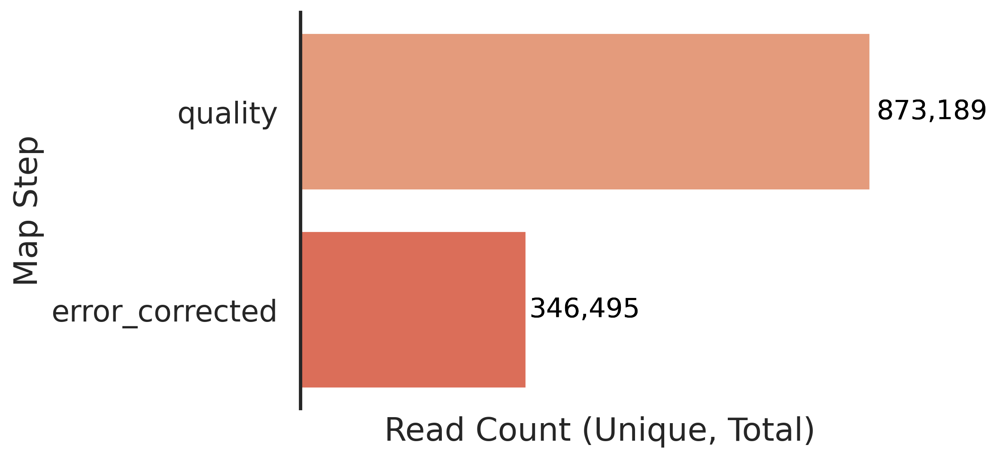

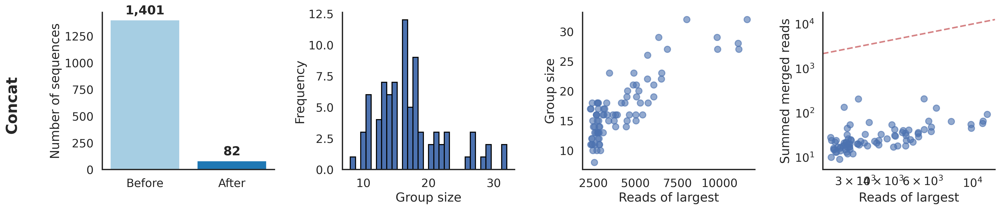

Done in 1.94 seconds.

82
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.fastq (346495 reads)...


Writing FASTQ: 100%|██████████| 346495/346495 [00:00<00:00, 2207721.25it/s]

FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.fastq
Done in 0.34 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r8_RNA_RTBC_S32_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index



Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC

Done in 1.16 seconds.

Aligning .FASTQ to reference .FA ...


346495 reads; of these:
  346495 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    346495 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_deduplicated.bam
# job started at Tue Nov 11 17:54:58 2025 on n0083.savio3 -- 9d3f63fa-ea3e-48be-85a9-36a7a829b844
# pid: 1505418, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/umi_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/umi_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/umi_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 421
Done in 0.16 seconds.

Whitelist application complete for umi_r7_RNA_RTBC_S31 at umi_r7_RNA_RTBC_S31_RTBC_error_corrected
Done in 11.94 seconds.

Done.
Saved loss summary table as 'umi_r7_RNA_RTBC_S31_RTBC_loss_summary'
Done in 0.02 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_

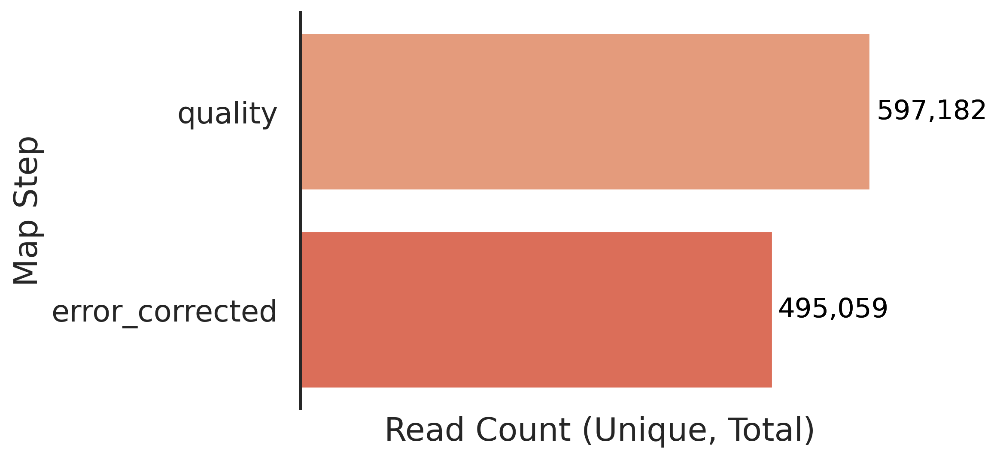

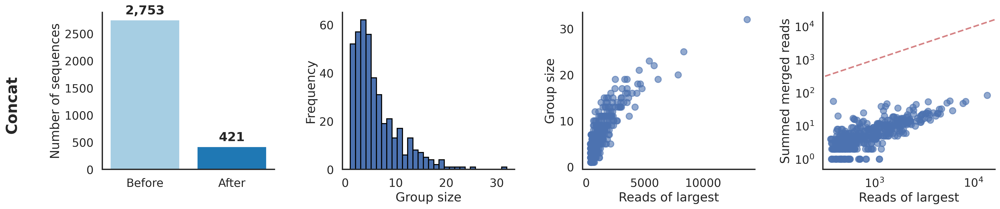

Done in 2.07 seconds.

421
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.fastq (495059 reads)...


Writing FASTQ: 100%|██████████| 495059/495059 [00:00<00:00, 2138931.81it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.fastq
Done in 0.50 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r7_RNA_RTBC_S31_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_

Done in 0.69 seconds.

Aligning .FASTQ to reference .FA ...


495059 reads; of these:
  495059 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    495059 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_deduplicated.bam
# job started at Tue Nov 11 17:55:50 2025 on n0083.savio3 -- ca3d8e08-e5d4-4a99-a38d-c43b06ac91db
# pid: 1505703, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/umi_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/umi_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/umi_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 595
Done in 0.20 seconds.

Whitelist application complete for umi_r1_RNA_RTBC_S25 at umi_r1_RNA_RTBC_S25_RTBC_error_corrected
Done in 15.63 seconds.

Done.
Saved loss summary table as 'umi_r1_RNA_RTBC_S25_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_

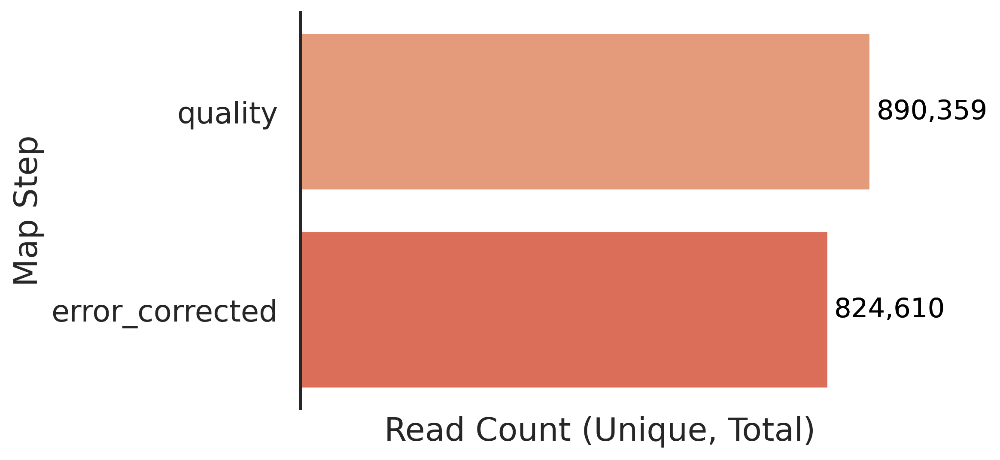

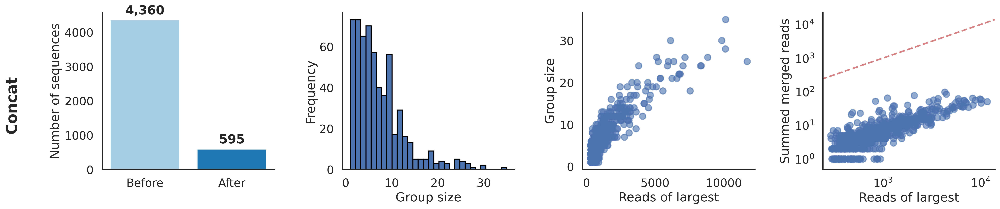

Done in 2.31 seconds.

595
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.fastq (824610 reads)...


Writing FASTQ: 100%|██████████| 824610/824610 [00:00<00:00, 2305848.93it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.fastq
Done in 0.80 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r1_RNA_RTBC_S25_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_

Done in 0.99 seconds.

Aligning .FASTQ to reference .FA ...


824610 reads; of these:
  824610 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    824610 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_deduplicated.bam
# job started at Tue Nov 11 17:56:41 2025 on n0083.savio3 -- 2c7a284c-f16e-482e-b42d-b37e3ec13117
# pid: 1505952, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/umi_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/umi_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/umi_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 490
Done in 0.22 seconds.

Whitelist application complete for umi_r6_RNA_RTBC_S30 at umi_r6_RNA_RTBC_S30_RTBC_error_corrected
Done in 16.07 seconds.

Done.
Saved loss summary table as 'umi_r6_RNA_RTBC_S30_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_

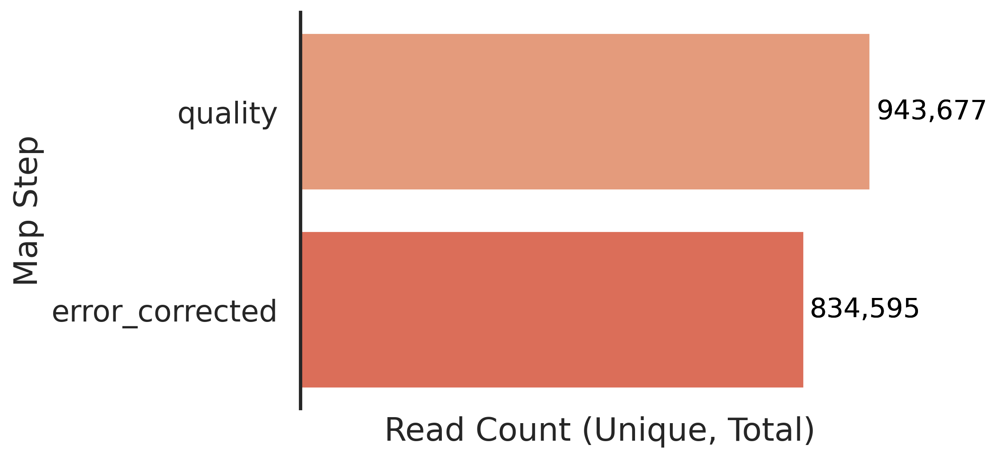

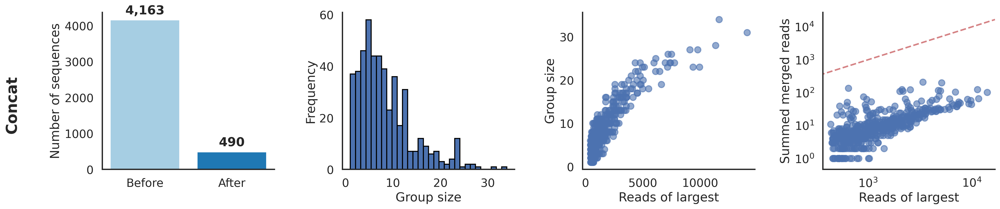

Done in 1.98 seconds.

490
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.fastq (834595 reads)...


Writing FASTQ: 100%|██████████| 834595/834595 [00:00<00:00, 2256772.42it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.fastq
Done in 0.81 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r6_RNA_RTBC_S30_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_

Done in 1.42 seconds.

Aligning .FASTQ to reference .FA ...


834595 reads; of these:
  834595 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    834595 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_deduplicated.bam
# job started at Tue Nov 11 17:57:50 2025 on n0083.savio3 -- 11189a12-4a09-493b-9b12-1e64a45ded89
# pid: 1506214, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/umi_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/umi_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/umi_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 378
Done in 0.21 seconds.

Whitelist application complete for umi_r3_RNA_RTBC_S27 at umi_r3_RNA_RTBC_S27_RTBC_error_corrected
Done in 15.64 seconds.

Done.
Saved loss summary table as 'umi_r3_RNA_RTBC_S27_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_

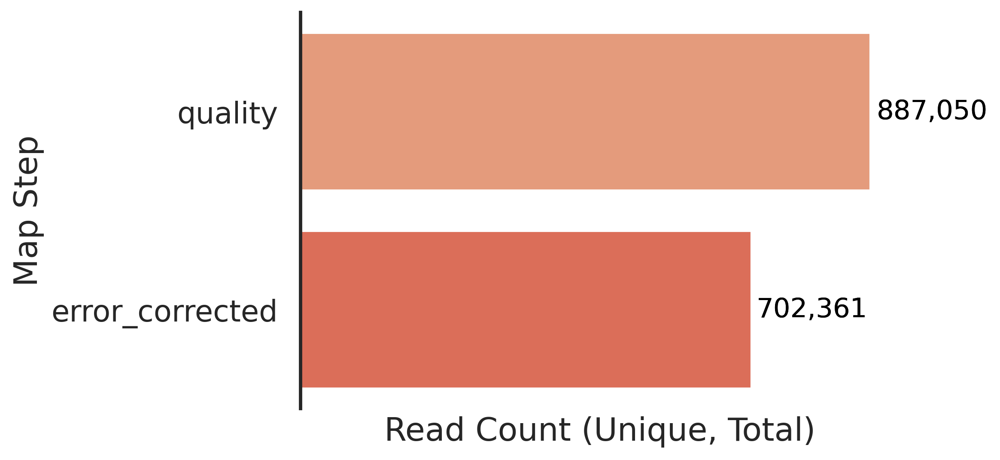

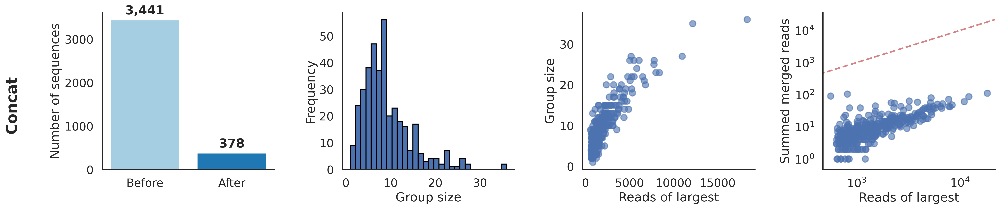

Done in 1.97 seconds.

378
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.fastq (702361 reads)...


Writing FASTQ: 100%|██████████| 702361/702361 [00:00<00:00, 2286367.20it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.fastq
Done in 0.67 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r3_RNA_RTBC_S27_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_

Done in 1.44 seconds.

Aligning .FASTQ to reference .FA ...


702361 reads; of these:
  702361 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    702361 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_deduplicated.bam
# job started at Tue Nov 11 17:58:59 2025 on n0083.savio3 -- 615234d9-da9f-43a4-8c84-5f1c78901c15
# pid: 1506467, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/umi_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/umi_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/umi_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 23
Done in 0.09 seconds.

Whitelist application complete for umi_r5_RNA_RTBC_S29 at umi_r5_RNA_RTBC_S29_RTBC_error_corrected
Done in 10.52 seconds.

Done.
Saved loss summary table as 'umi_r5_RNA_RTBC_S29_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_R

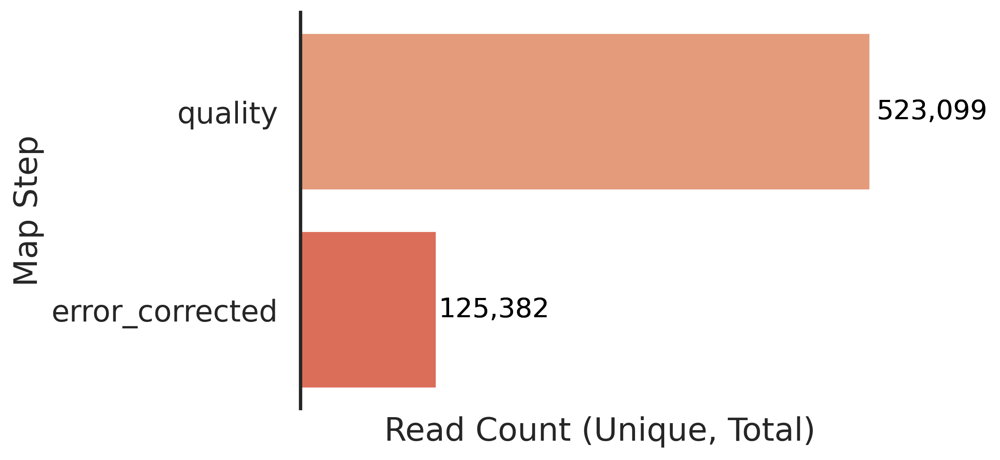

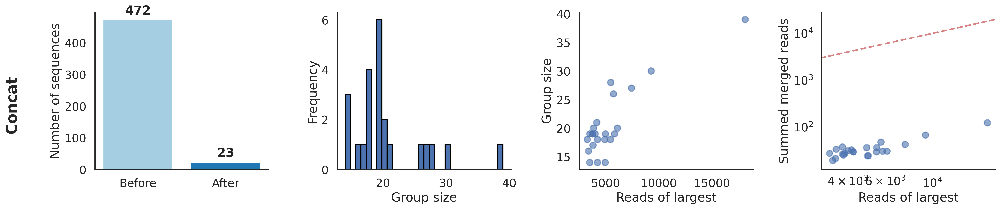

Done in 1.92 seconds.

23
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.fastq (125382 reads)...


Writing FASTQ: 100%|██████████| 125382/125382 [00:00<00:00, 1863880.74it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.fastq
Done in 0.15 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r5_RNA_RTBC_S29_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_

Done in 1.01 seconds.

Aligning .FASTQ to reference .FA ...


125382 reads; of these:
  125382 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    125382 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...
Indexing BAM ...
Deduplicating UMIs ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_deduplicated.bam
# job started at Tue Nov 11 17:59:51 2025 on n0083.savio3 -- 0b25b273-e154-4eca-b927-75644e1cd486
# pid: 1506714, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                    

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.69 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.61 seconds.

Extracting 1 barcodes...
GCCCC(.*)GCGG
Done in 0.53 seconds.

Extracting UMIs (12 bases)...
Done in 0.24 seconds.

Done in 0.70 seconds.

Mapping complete.
Base prefix (stable across descriptors): umi_r4_RNA_RTBC_S28_RTBC_
Full prefix for this instance: umi_r4_RNA_RTBC_S28_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: umi_r4_RNA_RTBC_S28_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 0.85 seconds.


=== Running error correction step on umi_r4_RNA_RTBC_S28_RTBC_quality ===

=== Applying whitelist for umi_r4_RNA_RTBC_S28 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted.fastq
Wrote 1549966 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/u

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 97
Done in 0.19 seconds.

Whitelist application complete for umi_r4_RNA_RTBC_S28 at umi_r4_RNA_RTBC_S28_RTBC_error_corrected
Done in 20.13 seconds.

Done.
Saved loss summary table as 'umi_r4_RNA_RTBC_S28_RTBC_loss_summary'
Done in 0.01 seconds.

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_R

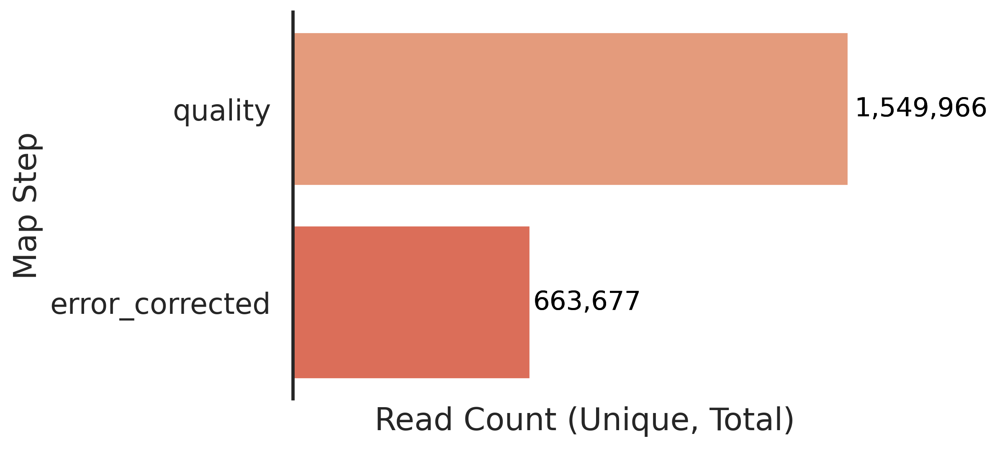

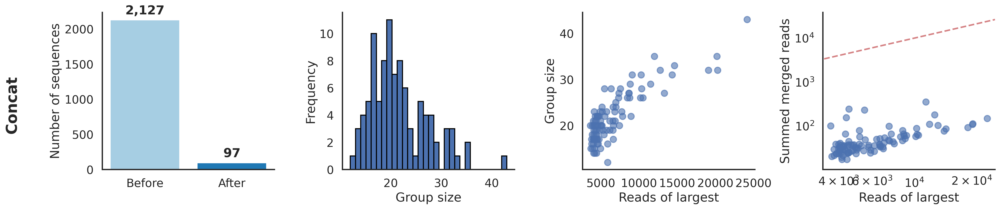

Done in 1.99 seconds.

97
Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.fastq (663677 reads)...


Writing FASTQ: 100%|██████████| 663677/663677 [00:00<00:00, 2206540.28it/s]


FASTQ complete: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.fastq
Done in 0.68 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: umi_r4_RNA_RTBC_S28_RTBC_unique_barcodes
Writing FASTA to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index


Building a SMALL index
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2
Renaming /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.1.bt2.tmp to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_

Done in 0.98 seconds.

Aligning .FASTQ to reference .FA ...


663677 reads; of these:
  663677 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    663677 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.sorted.bam -S /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_deduplicated.bam
# job started at Tue Nov 11 18:00:42 2025 on n0083.savio3 -- c3d49cac-5f4f-462e-876e-851c6ec21708
# pid: 1506992, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                       

In [28]:
for file_path in RT_seq_files:
    
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    # Get the file naeme to use for output
    umi_path = os.path.join(output_path, f"umi_{name_only}")
    print(umi_path)

    # Extract UMIs and barcodes from reads
    umi_mapper = initial_map.InitialMapper(db_path = db_path,
                                       step_name = f"umi_{name_only}", 
                                       seq_file = file_path,
                                       design_file_path = None,
                                       bc_objects = [step1_RTBC],
                                       reverse_complement = True,
                                       umi_length = 12)
    umi_mapper.create_map()

    # Only keep barcodes of correct length
    refiner = map_refiner.MapRefiner(db_path = db_path,
                                        bc_objects=RTBC_objects,
                                        column_pairs = [],
                                        reads_threshold = 1,
                                        map_order = ['quality', 'error_corrected'],
                                        step_name=f"umi_{name_only}", 
                                        descriptor = "",
                                        output_figures_path = umi_path)
    refiner.refine_map_from_db()
    refiner.plot_loss()
    refiner.plot_error_correction()
    error_corrected = refiner.get_map_df('error_corrected')
    print(len(error_corrected[["RTBC"]].drop_duplicates()))
    
    # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = RTBC_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    deduplicator.run_both_deduplications()

    # Collect results
    one_file_complex_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_directional_umi_counts.tsv"), sep = "\t")
    one_file_complex_results["name"] = name_only
    complex_RPTR_results.append(one_file_complex_results)

    one_file_simple_results = pd.read_csv(os.path.join(umi_path, f"{name_only}_simple_umi_counts.tsv"), sep = "\t")
    one_file_simple_results["name"] = name_only
    simple_RPTR_results.append(one_file_simple_results)

In [29]:
all_complex_RPTR_results_df = pd.concat(complex_RPTR_results)
all_complex_RPTR_results_df = all_complex_RPTR_results_df.rename(columns = {"count" : "RTBC_umi_count", "gene" : "RTBC"})
all_complex_RPTR_results_df["number"] = all_complex_RPTR_results_df["name"].str[1]
all_complex_RPTR_results_df

,RTBC,RTBC_umi_count,name,number
0,ATAAATGGCTTTATTA,707,r2_RNA_RTBC_S26,2
1,ATTTTTGAATTTTTAT,7313,r2_RNA_RTBC_S26,2
2,AACAGGAAACATGAAT,4047,r2_RNA_RTBC_S26,2
3,ACATGTCATTTTAATC,1447,r2_RNA_RTBC_S26,2
4,GTTCCTTAGTTCAAGG,1809,r2_RNA_RTBC_S26,2
...,...,...,...,...
92,CAAAATGTTATGAAGA,4368,r4_RNA_RTBC_S28,4
93,TTATGATGAATAAACT,2734,r4_RNA_RTBC_S28,4
94,TACAAGCCAAAGTTAC,2958,r4_RNA_RTBC_S28,4
95,TCGACCTTAAATAAGC,4363,r4_RNA_RTBC_S28,4


In [30]:
all_complex_RPTR_results_df.to_csv(os.path.join(output_path, f"all_complex_RPTR_results.csv"))

In [31]:
all_simple_RPTR_results_df = pd.concat(simple_RPTR_results)
all_simple_RPTR_results_df = all_simple_RPTR_results_df.rename(columns = {"count" : "RTBC_umi_count"})
all_simple_RPTR_results_df["number"] = all_simple_RPTR_results_df["name"].str[1]
all_simple_RPTR_results_df

,RTBC,RTBC_umi_count,name,number
0,TTGACTATAATACATA,9774,r2_RNA_RTBC_S26,2
1,AGATATGCTTCTCGAT,9142,r2_RNA_RTBC_S26,2
2,ATGACAATGAACATAT,8581,r2_RNA_RTBC_S26,2
3,CGAGCCTATAGCATAA,8517,r2_RNA_RTBC_S26,2
4,ATTTTTGAATTTTTAT,7439,r2_RNA_RTBC_S26,2
...,...,...,...,...
92,AACATATCCAACGCTG,2588,r4_RNA_RTBC_S28,4
93,TGTTTGTGATATATGA,2557,r4_RNA_RTBC_S28,4
94,TATTTACCGTAGCAAT,2542,r4_RNA_RTBC_S28,4
95,TGCGGGCGAGATTTTG,2522,r4_RNA_RTBC_S28,4


In [32]:
all_simple_RPTR_results_df.to_csv(os.path.join(output_path, f"all_simple_RPTR_results.csv"))

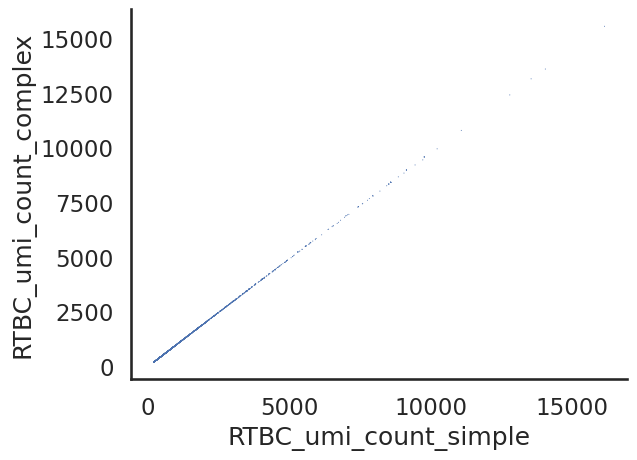

In [33]:
# Both simple and complex counts are roughly y = x which checks out!
RPTR_results_merged = pd.merge(all_complex_RPTR_results_df, all_simple_RPTR_results_df, on = ["RTBC", "name", "number"],suffixes = ("_complex", "_simple"))
sns.scatterplot(data = RPTR_results_merged, x = "RTBC_umi_count_simple", y = "RTBC_umi_count_complex", s  = 0.5, edgecolor = 'none')
sns.despine()
plt.savefig(os.path.join(output_path, f"RPTR_umi_count_comparison.png"), bbox_inches='tight')


In [34]:
RPTR_results_merged["name"].value_counts()

name
r2_RNA_RTBC_S26    1840
r1_RNA_RTBC_S25     595
r6_RNA_RTBC_S30     490
r7_RNA_RTBC_S31     421
r3_RNA_RTBC_S27     378
r4_RNA_RTBC_S28      97
r8_RNA_RTBC_S32      82
r5_RNA_RTBC_S29      23
Name: count, dtype: int64

# Now, merge with step1 map

In [9]:
step1_map = pd.read_csv(step1_csv, index_col = 0)
step1_map

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1
2,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3896,True,True,True,True,1
3,TCAGTA,ACCGTTACC,AATGGGCCCGATCTAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,3878,True,True,True,True,1
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3871,True,True,True,True,1
...,...,...,...,...,...,...,...,...,...,...
1486,CGGATT,ACGCAATCC,TGTAGGCCCGATAGCT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,335,True,True,True,True,1
1487,TAATTC,AAGCTGCGA,GGATCTGCAGCTCTGA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,308,True,True,True,True,1
1488,TCACAG,AGTCCTCCT,TATTAACTACGAAAAA,TATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGGC...,255,True,True,True,True,1
1489,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1


In [48]:
# Concatenated ADBC2 and HawkBC
step1_map["ADBC_concat"] = step1_map["ADBC2"] + step1_map["HawkBCs"] 
step1_map

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1,TGTACAATTCTCGCC
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT
2,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3896,True,True,True,True,1,ACGTATAGTGTGCGT
3,TCAGTA,ACCGTTACC,AATGGGCCCGATCTAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,3878,True,True,True,True,1,TCAGTAACCGTTACC
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3871,True,True,True,True,1,ACGTTACCGTGATAC
...,...,...,...,...,...,...,...,...,...,...,...
1486,CGGATT,ACGCAATCC,TGTAGGCCCGATAGCT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,335,True,True,True,True,1,CGGATTACGCAATCC
1487,TAATTC,AAGCTGCGA,GGATCTGCAGCTCTGA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,308,True,True,True,True,1,TAATTCAAGCTGCGA
1488,TCACAG,AGTCCTCCT,TATTAACTACGAAAAA,TATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGGC...,255,True,True,True,True,1,TCACAGAGTCCTCCT
1489,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1,TCAAATAACTCCGTA


In [49]:
# Add simple AD UMI counts to step1 map
step1_map_with_AD = pd.merge(step1_map, AD_results_merged).drop_duplicates()
step1_map_with_AD

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,AD_umi_count_complex,name,number,AD_umi_count_simple
0,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,883,a2_RNA_ADBC_S18,2,891
4,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,661,a1_RNA_ADBC_S17,1,663
5,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,806,a3_RNA_ADBC_S19,3,808
6,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,703,a6_RNA_ADBC_S22,6,705
7,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,818,a4_RNA_ADBC_S20,4,818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2314,TTCCTA,CATCCACTA,GGTTTGTTACCATTTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,499,True,True,True,True,1,TTCCTACATCCACTA,536,a4_RNA_ADBC_S20,4,537
2315,GATATC,ACCTATCAC,TGTATTTTCAGATTCG,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,449,True,True,True,True,1,GATATCACCTATCAC,288,a1_RNA_ADBC_S17,1,288
2316,GATATC,ACCTATCAC,TGTATTTTCAGATTCG,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,449,True,True,True,True,1,GATATCACCTATCAC,517,a3_RNA_ADBC_S19,3,517
2317,GATATC,ACCTATCAC,TGTATTTTCAGATTCG,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,449,True,True,True,True,1,GATATCACCTATCAC,588,a4_RNA_ADBC_S20,4,592


In [50]:
# Add RPTR UMI counts to step1 map
step1_map_with_RPTR = pd.merge(step1_map, RPTR_results_merged).drop_duplicates()
step1_map_with_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,RTBC_umi_count_complex,name,number,RTBC_umi_count_simple
0,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,822,r2_RNA_RTBC_S26,2,826
4,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,406,r7_RNA_RTBC_S31,7,407
5,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,729,r1_RNA_RTBC_S25,1,733
6,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,640,r6_RNA_RTBC_S30,6,643
7,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1,GTAATCCAGCGGTAT,787,r3_RNA_RTBC_S27,3,792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3276,GATATC,ACCTATCAC,TGTATTTTCAGATTCG,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,449,True,True,True,True,1,GATATCACCTATCAC,383,r1_RNA_RTBC_S25,1,386
3277,GATATC,ACCTATCAC,TGTATTTTCAGATTCG,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,449,True,True,True,True,1,GATATCACCTATCAC,529,r6_RNA_RTBC_S30,6,533
3278,TTAGCA,ACAAGCCAC,TAATTACACCAATGTC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,439,True,True,True,True,1,TTAGCAACAAGCCAC,271,r1_RNA_RTBC_S25,1,272
3279,TCGCGT,AGCCTTGTC,CAGTGTCCAAAGGCAA,CCCTTCAGCGCCTACAGCGCCCAGAGCCTGCAGCACATGGCCCAGG...,375,True,True,True,True,1,TCGCGTAGCCTTGTC,203,r1_RNA_RTBC_S25,1,205


In [51]:
merge_cols = set(step1_map_with_AD.columns) & set(step1_map_with_RPTR.columns)
merge_cols = [col for col in list(merge_cols) if col != "name"]
merge_cols

['RTBC',
 'RTBC_qual',
 'Designed',
 'AD',
 'ADBC2_qual',
 'number',
 'HawkBCs_qual',
 'ADBC2',
 'AD_qual',
 'ADBC_concat',
 'HawkBCs',
 'count']

In [52]:
step1_map_with_AD_RPTR = pd.merge(step1_map_with_AD, step1_map_with_RPTR, on = merge_cols, how = 'outer', suffixes = ("_AD", "_RPTR"))
step1_map_with_AD_RPTR = step1_map_with_AD_RPTR.fillna(0)
step1_map_with_AD_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,ADBC_concat,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple
0,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,AAAAGGCATAACAGG,636.0,a1_RNA_ADBC_S17,1,641.0,663.0,r1_RNA_RTBC_S25,666.0
1,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,AAAAGGCATAACAGG,794.0,a2_RNA_ADBC_S18,2,799.0,880.0,r2_RNA_RTBC_S26,883.0
2,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,AAAAGGCATAACAGG,0.0,0,6,0.0,492.0,r6_RNA_RTBC_S30,495.0
3,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,TCAACTACCGACAAC,0.0,0,3,0.0,441.0,r3_RNA_RTBC_S27,445.0
4,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,TCAACTACCGACAAC,431.0,a4_RNA_ADBC_S20,4,432.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2391,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,CTATGCACCATTAGG,0.0,0,6,0.0,326.0,r6_RNA_RTBC_S30,328.0
2392,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,CTATGCACCATTAGG,0.0,0,7,0.0,410.0,r7_RNA_RTBC_S31,412.0
2393,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,ATGAAACACCGATTG,829.0,a3_RNA_ADBC_S19,3,833.0,578.0,r3_RNA_RTBC_S27,581.0
2394,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,ATGAAACACCGATTG,626.0,a4_RNA_ADBC_S20,4,628.0,0.0,0,0.0


In [53]:
# Now, break down into a better more manageable table
# 1	R1N 24
# 2	R1incuded 24
# 3	R2N 24
# 4	R2Induced 24
# 5	R1N 48
# 6	R1incuded 48
# 7	R2N 48
# 8	R2Induced 48

# Define a mapping for each attribute
mapping = {
    "1": {"Replicate": "R1", "Induced": "No",  "Time": 24},
    "2": {"Replicate": "R1", "Induced": "Yes", "Time": 24},
    "3": {"Replicate": "R2", "Induced": "No",  "Time": 24},
    "4": {"Replicate": "R2", "Induced": "Yes", "Time": 24},
    "5": {"Replicate": "R1", "Induced": "No",  "Time": 48},
    "6": {"Replicate": "R1", "Induced": "Yes", "Time": 48},
    "7": {"Replicate": "R2", "Induced": "No",  "Time": 48},
    "8": {"Replicate": "R2", "Induced": "Yes", "Time": 48},
}

# Expand mapping into separate columns
step1_map_with_AD_RPTR = step1_map_with_AD_RPTR.join(step1_map_with_AD_RPTR["number"].map(mapping).apply(pd.Series))
step1_map_with_AD_RPTR

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,...,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple,Replicate,Induced,Time
0,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,636.0,a1_RNA_ADBC_S17,1,641.0,663.0,r1_RNA_RTBC_S25,666.0,R1,No,24
1,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,794.0,a2_RNA_ADBC_S18,2,799.0,880.0,r2_RNA_RTBC_S26,883.0,R1,Yes,24
2,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,0.0,0,6,0.0,492.0,r6_RNA_RTBC_S30,495.0,R1,Yes,48
3,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,...,0.0,0,3,0.0,441.0,r3_RNA_RTBC_S27,445.0,R2,No,24
4,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,...,431.0,a4_RNA_ADBC_S20,4,432.0,0.0,0,0.0,R2,Yes,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2391,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,...,0.0,0,6,0.0,326.0,r6_RNA_RTBC_S30,328.0,R1,Yes,48
2392,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,...,0.0,0,7,0.0,410.0,r7_RNA_RTBC_S31,412.0,R2,No,48
2393,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,...,829.0,a3_RNA_ADBC_S19,3,833.0,578.0,r3_RNA_RTBC_S27,581.0,R2,No,24
2394,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,...,626.0,a4_RNA_ADBC_S20,4,628.0,0.0,0,0.0,R2,Yes,24


In [54]:
# Final results 
final_results = step1_map_with_AD_RPTR
final_results

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed,...,AD_umi_count_complex,name_AD,number,AD_umi_count_simple,RTBC_umi_count_complex,name_RPTR,RTBC_umi_count_simple,Replicate,Induced,Time
0,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,636.0,a1_RNA_ADBC_S17,1,641.0,663.0,r1_RNA_RTBC_S25,666.0,R1,No,24
1,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,794.0,a2_RNA_ADBC_S18,2,799.0,880.0,r2_RNA_RTBC_S26,883.0,R1,Yes,24
2,AAAAGG,CATAACAGG,AAAAAACCCTTAAGTA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2053,True,True,True,True,1,...,0.0,0,6,0.0,492.0,r6_RNA_RTBC_S30,495.0,R1,Yes,48
3,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,...,0.0,0,3,0.0,441.0,r3_RNA_RTBC_S27,445.0,R2,No,24
4,TCAACT,ACCGACAAC,AAAAAATATCATCGAC,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,2395,True,True,True,True,1,...,431.0,a4_RNA_ADBC_S20,4,432.0,0.0,0,0.0,R2,Yes,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2391,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,...,0.0,0,6,0.0,326.0,r6_RNA_RTBC_S30,328.0,R1,Yes,48
2392,CTATGC,ACCATTAGG,TTTGCATAAATAAATT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,1283,True,True,True,True,1,...,0.0,0,7,0.0,410.0,r7_RNA_RTBC_S31,412.0,R2,No,48
2393,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,...,829.0,a3_RNA_ADBC_S19,3,833.0,578.0,r3_RNA_RTBC_S27,581.0,R2,No,24
2394,ATGAAA,CACCGATTG,TTTTTAAATCAAAGGT,GCCGGCGACCTGGCCGCCGCCACCTTCGGCGCCGGCATTCCCTTCA...,2246,True,True,True,True,1,...,626.0,a4_RNA_ADBC_S20,4,628.0,0.0,0,0.0,R2,Yes,24


In [55]:
# 186 ADs with UMI counts for AD and RTBC
final_results["AD"].value_counts()

AD
GCCCTGGACCTGGCCGCCGCCACCTTCCTGGCCGGCATTCCCTTCAGCGCCTACAGCGCCCTGAGCCTGCTGCACATGCTGTACAACGCCCTGTACAGCAGCGCCAGCACACCTCTGTATCCCACCGCCCATCCTCTGGTGCTGGCCCTGCTGTGGACCTGG    81
GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCACCGCCTACACCGCCCAGACCCTGCAGCACATGCAGTACAACGCCCAGTACACCACCGCCACCACACCTCAGTATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGG    52
GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCAGCGCCTACAGCGCCCAGAGCCTGCAGCACATGCAGTACAACGCCCAGTACAGCAGCGCCAGCACACCTCAGTATCCCACACCTCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGG    49
GCCACCGACCTGGCCGCCGCCACCTTCACCGCCGGCATTCCCTTCAGCGCCTACAGCGCCACCAGCCTGACCCACATGACCTACAACGCCACCTACAGCAGCGCCAGCACACCCACCTATCCCACCGCCCATCCTCTGGTGACCGCCACCACCTGGACCTGG    43
GCCCAGGACCTGGCCGCCGCCGCCTTCCAGGCCGGCATTCCCTTCAGCGCCTACAGCGCCCAGAGCCTGCAGCACATGCAGTACAACGCCCAGTACAGCAGCGCCAGCGCTCCTCAGTATCCCGCCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGGCCTGG    43
                                                                                                                                                        

In [56]:
final_results.to_csv(os.path.join(output_path, f"results_with_step1.csv"))

# BC Quality Loss

In [18]:
len(df["RTBC"].unique())

82

umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_error_corrected step1 count: 533519
umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_error_corrected step1 count: 478908
umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_error_corrected step1 count: 453302
umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_error_corrected step1 count: 427175
umi_a5_RNA_ADBC_S21_ADBC2_HawkBCs_error_corrected step1 count: 110400
umi_a6_RNA_ADBC_S22_ADBC2_HawkBCs_error_corrected step1 count: 390720
umi_a7_RNA_ADBC_S23_ADBC2_HawkBCs_error_corrected step1 count: 165121
umi_a8_RNA_ADBC_S24_ADBC2_HawkBCs_error_corrected step1 count: 202655


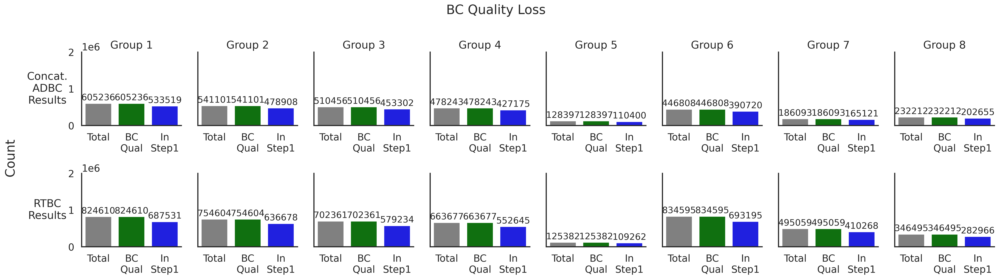

In [15]:
fig, axes = plt.subplots(2, 8, figsize=(24,6), dpi=300, sharey=True, sharex = False)
axes = axes.flatten()  # flatten to index easily 0..15

# First row: AD (ADBC/HawkBCs)
for i in np.arange(1, 9):
    file_name = f'umi_a{i}_RNA_ADBC_S{16 + i}_ADBC2_HawkBCs_error_corrected'
    df = refiner.get_map_df(file_name)
    
    total_count = len(df)
    both_true = ((df["ADBC2_qual"]) & (df["HawkBCs_qual"])).sum()
    step1_count = len(df[(df["ADBC2"].isin(step1_map["ADBC2"])) & (df["HawkBCs"].isin(step1_map["HawkBCs"]))])
    print(f"{file_name} step1 count: {step1_count}")

    plot_counts = pd.DataFrame({
        "Category": ["Total", "BC\nQual", "In\nStep1"],
        "Count": [total_count, both_true, step1_count]
    })

    ax = axes[i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=["gray", "green", "blue"])
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    ax.set_title("Group " + str(file_name[:6][-1]), fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

# Second row: RPTR (RTBC)
for i in np.arange(1, 9):
    file_name = f'umi_r{i}_RNA_RTBC_S{24 + i}_RTBC_error_corrected'
    df = refiner.get_map_df(file_name)
    
    total_count = len(df)
    true_count = df["RTBC_qual"].sum()  # assuming boolean True/False
    step1_count = len(df[df["RTBC"].isin(step1_map["RTBC"])])
   
    plot_counts = pd.DataFrame({
        "Category": ["Total", "BC\nQual", "In\nStep1"],
        "Count": [total_count, true_count, step1_count]
    })

    ax = axes[8 + i - 1]
    sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=["gray", "green", "blue"])
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', label_type='edge', fontsize='small', padding=2)

    #ax.set_title(file_name[:6], fontsize='medium')
    ax.set_xlabel("")
    ax.set_ylabel("")

axes[0].set_ylabel("Concat.\nADBC\nResults", rotation = 0, labelpad = 35, va = 'center')
axes[8].set_ylabel("RTBC\nResults", rotation = 0, labelpad = 35, va = 'center')

axes[0].set_ylim(0, 2000000)
fig.supylabel("Count")
sns.despine()
plt.tight_layout(pad = 1)
fig.suptitle("BC Quality Loss", y = 1.1)
plt.savefig(os.path.join(output_path, f"bc_quality_loss.png"))
plt.show()

In [189]:
i = 1
file_name = f'umi_a{i}_RNA_ADBC_S{16 + i}_ADBC2_HawkBCs_initial'
df = refiner.get_map_df(file_name)
ADBC2_nulls = len(df[df["ADBC2"] == ""])
ADBC2_wrong_len = len(df[(df["ADBC2"] != "") & (df["ADBC2"].str.len() != 6)])
ADBC2_qual = len(df[df["ADBC2_qual"]])

HawkBCs_nulls = len(df[df["HawkBCs"] == ""])
HawkBCs_wrong_len = len(df[(df["HawkBCs"] != "") & (df["HawkBCs"].str.len() != 9)])
HawkBCs_qual = len(df[df["HawkBCs_qual"]])

both_good = len(df[(df["HawkBCs_qual"] == True) & (df["ADBC2_qual"] == True)])
df
# total_count = len(df)
# both_true = ((df["ADBC2_qual"]) & (df["HawkBCs_qual"])).sum()

# plot_counts = pd.DataFrame({
#     "Category": ["Total", "BC_Qual"],
#     "Count": [total_count, both_true]
# })

# ax = axes[i-1]
# bars = sns.barplot(x="Category", y="Count", data=plot_counts, ax=ax, palette=["gray", "green"])

# for container in ax.containers:
#     ax.bar_label(container, fmt='%d', label_type='edge', fontsize=8, padding=2)

# ax.set_title("Group " + str(file_name[:6][-1]), fontsize='medium')
# ax.set_xlabel("")
# ax.set_ylabel("")

,ADBC2,ADBC2_qual,HawkBCs,HawkBCs_qual,UMI,Designed
0,GTACAA,True,CCATCGGTT,True,GTTAGGCGATTA,1
1,GGTGCT,True,CAACTACAG,True,TAAACACGCGAA,1
2,ATGATC,True,CAATCTCTC,True,GTGACTAGATGG,1
3,GAGAAG,True,CAGATCGTT,True,ACCCGTTGAGCG,1
4,AAGCAG,True,CATCCTGTC,True,TAGTGCTTAGCA,1
...,...,...,...,...,...,...
389293,AAAGTT,True,CATGTTGCC,True,CGACTCCGGCTC,1
389294,CAGGTA,True,CACAACTTC,True,ATGATAAACTTG,1
389295,CTACGG,True,CATACGATC,True,CGCCCCAACCAC,1
389296,CTATAA,True,CACGAGATC,True,CAACAGGATTAA,1


In [190]:
# fig, ax = plt.subplots(figsize=(4, 6), dpi=150)

# rep_labels = []
# segments = {"Nulls": [], "Wrong Length": [], "Valid": []}  # order

# bar_height = 0.2  # height of each small segment
# y_pos = np.arange(8)  # center y-position for each replicate

# for i in np.arange(1, 9):
#     file_name = f'umi_r{i}_RNA_RTBC_S{24 + i}_RTBC_initial'
#     df = refiner.get_map_df(file_name)
    
#     # Compute counts
#     num_nulls = len(df[df["RTBC"] == ""])
#     len_wrong_length = len(df[(df["RTBC"] != "") & (df["RTBC"].str.len() != 16)])
#     len_qual = len(df[df["RTBC_qual"]])
    
#     rep_labels.append(f"R{i}")
#     segments["Nulls"].append(num_nulls)
#     segments["Wrong Length"].append(len_wrong_length)
#     segments["Valid"].append(len_qual)

# # Colors
# category_colors = {"Nulls": "maroon", "Wrong Length": "red", "Valid": "green"}

# # Offsets for top → middle → bottom stacking
# offsets = {"Nulls": bar_height, "Wrong Length": 0, "Valid": -bar_height}

# # Plot each segment
# for seg_name in ["Nulls", "Wrong Length", "Valid"]:
#     ax.barh(y_pos + offsets[seg_name], segments[seg_name], height=bar_height,
#             color=category_colors[seg_name], edgecolor="none", label=seg_name)
    
#     # Add labels to the right of each segment
#     for y, val in zip(y_pos + offsets[seg_name], segments[seg_name]):
#         if val > 0:
#             ax.text(val + 5, y, str(val), va='center', ha='left', color=category_colors[seg_name], fontsize=9)

# # Y-axis ticks
# ax.set_yticks(y_pos)
# ax.set_yticklabels(rep_labels)

# ax.set_xlabel("Count")
# ax.set_title("RTBC Loss")
# ax.legend(title="Category", loc = 'upper right', bbox_to_anchor = (2,1))
# sns.despine(bottom=True)
# plt.tight_layout()
# plt.show()

# Reads per UMI

In [28]:
ADBC_reads_per_umi = []

for file_path in AD_seq_files:
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 
    
    umi_path = os.path.join(output_path, f"umi_{name_only}")

    # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = AD_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    one_file_reads_per_UMI = deduplicator.counts_per_umi()
    one_file_reads_per_UMI["name"] = name_only
    ADBC_reads_per_umi.append(one_file_reads_per_UMI)
    
ADBC_reads_per_umi = pd.concat(ADBC_reads_per_umi)
ADBC_reads_per_umi

a2_RNA_ADBC_S18
a7_RNA_ADBC_S23
a1_RNA_ADBC_S17
a3_RNA_ADBC_S19
a6_RNA_ADBC_S22
a4_RNA_ADBC_S20
a8_RNA_ADBC_S24
a5_RNA_ADBC_S21


,ADBC2,HawkBCs,UMI,reads,name
0,AAAAAT,CATCTTAGG,TTGATTAGGCCT,5,a2_RNA_ADBC_S18
1,AAAAAT,CATCTTAGG,TGCTAACGAGAA,4,a2_RNA_ADBC_S18
2,AAAAAT,CATCTTAGG,ACTTGTGCGTAG,4,a2_RNA_ADBC_S18
3,AAAAAT,CATCTTAGG,CCAACCAAACAA,4,a2_RNA_ADBC_S18
4,AAAAAT,CATCTTAGG,GTAAACCCCCAC,4,a2_RNA_ADBC_S18
...,...,...,...,...,...
93753,TTAGGC,CAACAGTGC,TTACGCGCGCAT,1,a5_RNA_ADBC_S21
93754,TTAGGC,CAACAGTGC,AGCGTGGCCGTC,1,a5_RNA_ADBC_S21
93755,TTAGGC,CAACAGTGC,TTTCTGGACCTG,1,a5_RNA_ADBC_S21
93756,TTAGGC,CAACAGTGC,ACATGGAAAGCA,1,a5_RNA_ADBC_S21


In [49]:
ADBC_reads_per_umi.to_csv(os.path.join(output_path, f"ADBC_reads_per_umi.csv"))

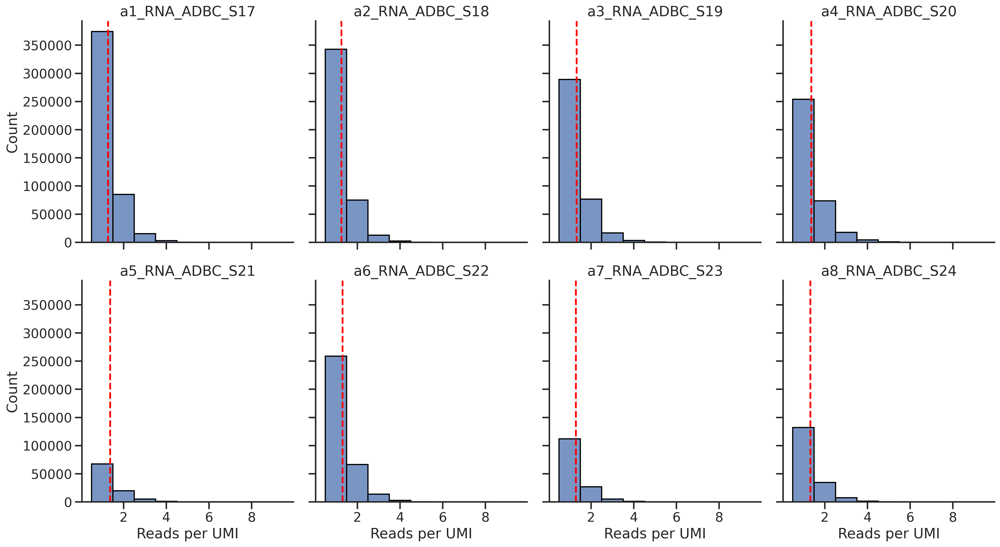

In [44]:
import math

groups = list(ADBC_reads_per_umi.groupby("name"))
n = len(groups)

rows = math.ceil(n / 4)   # 4 columns
cols = 4

sns.set_context('talk')
sns.set_style('ticks')
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows), sharey=True, sharex = True, dpi = 300)

axes = axes.flatten()   # make indexing easy

for ax, (name, df) in zip(axes, groups):
    sns.histplot(
        df["reads"],
        bins=50,
        discrete=True,
        edgecolor="black",
        ax=ax
    )
    ax.axvline(np.mean(df["reads"]), color = 'red', linestyle = 'dashed')
    ax.set_title(name)
    ax.set_xlabel("Reads per UMI")
    ax.set_ylabel("Count")
    sns.despine(ax=ax)

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


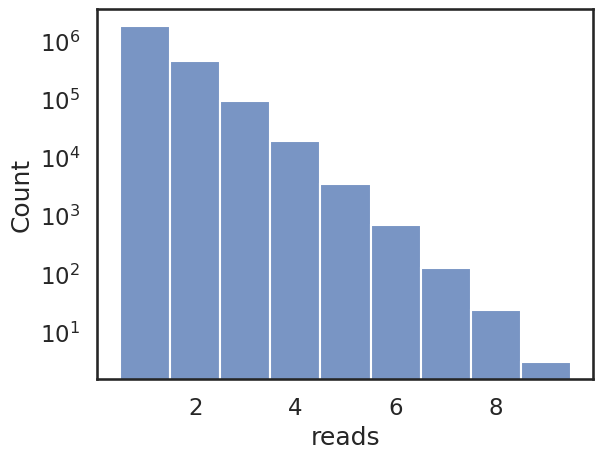

In [29]:
ax = sns.histplot(ADBC_reads_per_umi['reads'], discrete = True)
ax.set_yscale('log')

In [46]:
RTBC_reads_per_umi = []
for file_path in RT_seq_files:
    # Get the file naeme to use for database
    base_name = os.path.basename(file_path)
    name_only = base_name.split('.')[0]
    print(name_only) 

    umi_path = os.path.join(output_path, f"umi_{name_only}")

    # Run both deduplications
    deduplicator = umi_deduplicate.UMIDeduplicator(db_path = db_path,
                                                        bc_objects = RTBC_objects,
                                                        step_name = f"umi_{name_only}", 
                                                        descriptor = "",
                                                        step1_map_name = None,
                                                        fastq_path = file_path,
                                                        umi_length = 12,
                                                        output_path = umi_path)

    one_file_reads_per_UMI = deduplicator.counts_per_umi()
    one_file_reads_per_UMI["name"] = name_only
    RTBC_reads_per_umi.append(one_file_reads_per_UMI)
RTBC_reads_per_umi = pd.concat(RTBC_reads_per_umi)
RTBC_reads_per_umi

r2_RNA_RTBC_S26
r8_RNA_RTBC_S32
r7_RNA_RTBC_S31
r1_RNA_RTBC_S25
r6_RNA_RTBC_S30
r3_RNA_RTBC_S27
r5_RNA_RTBC_S29
r4_RNA_RTBC_S28


,RTBC,UMI,reads,name
0,AAAAAACCCTTAAGTA,CCCGATTACCTT,4,r2_RNA_RTBC_S26
1,AAAAAACCCTTAAGTA,CCGCTGTCGCGC,4,r2_RNA_RTBC_S26
2,AAAAAACCCTTAAGTA,AACTCCCGGACT,4,r2_RNA_RTBC_S26
3,AAAAAACCCTTAAGTA,CTAACTGCGACT,4,r2_RNA_RTBC_S26
4,AAAAAACCCTTAAGTA,TCCCCTACTATA,4,r2_RNA_RTBC_S26
...,...,...,...,...
437771,TTTCTAATTCAACATC,TAATCGCAAGAC,1,r4_RNA_RTBC_S28
437772,TTTCTAATTCAACATC,GCCCACCAGTAT,1,r4_RNA_RTBC_S28
437773,TTTCTAATTCAACATC,CAACGCCACTCA,1,r4_RNA_RTBC_S28
437774,TTTCTAATTCAACATC,AAAACCAAGAGT,1,r4_RNA_RTBC_S28


In [50]:
RTBC_reads_per_umi.to_csv(os.path.join(output_path, f"RTBC_reads_per_umi.csv"))

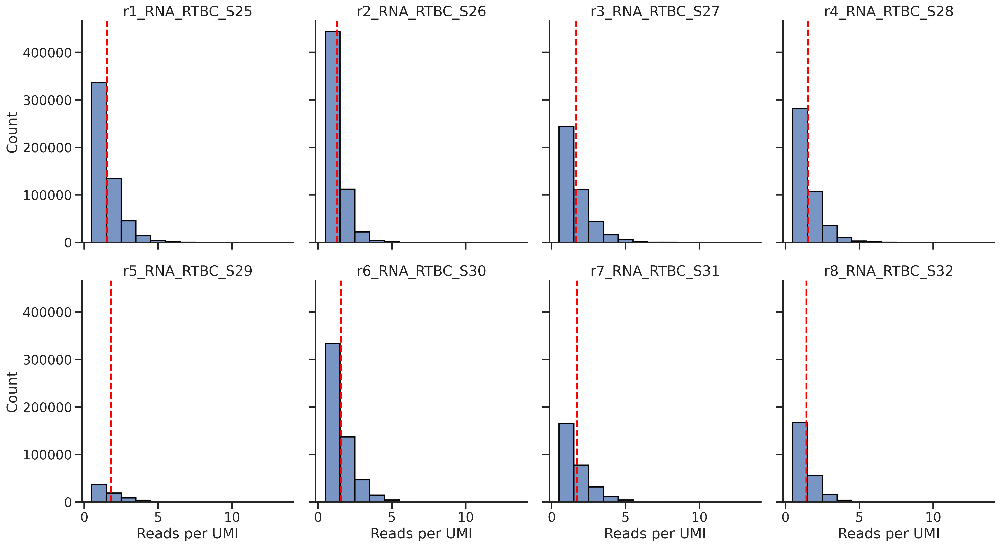

In [47]:
import math

groups = list(RTBC_reads_per_umi.groupby("name"))
n = len(groups)

rows = math.ceil(n / 4)   # 4 columns
cols = 4

sns.set_context('talk')
sns.set_style('ticks')
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows), sharey=True, sharex = True, dpi = 300)

axes = axes.flatten()   # make indexing easy

for ax, (name, df) in zip(axes, groups):
    sns.histplot(
        df["reads"],
        bins=50,
        discrete=True,
        edgecolor="black",
        ax=ax
    )
    ax.axvline(np.mean(df["reads"]), color = 'red', linestyle = 'dashed')
    ax.set_title(name)
    ax.set_xlabel("Reads per UMI")
    ax.set_ylabel("Count")
    sns.despine(ax=ax)

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


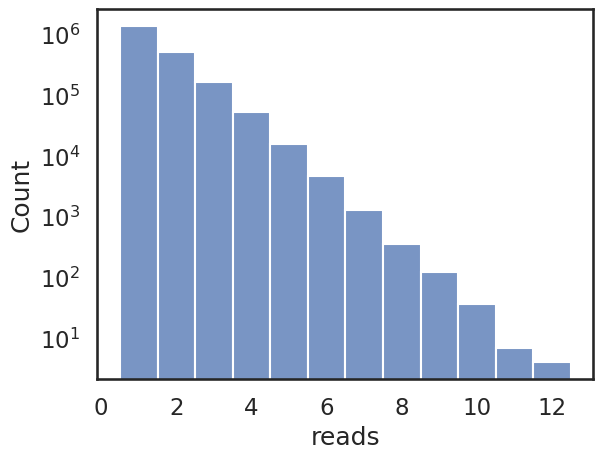

In [197]:
ax = sns.histplot(RTBC_reads_per_umi['reads'], discrete = True)
ax.set_yscale('log')

# Compiling densities

In [13]:
AD_paths = glob.glob(
    "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_*_RNA_ADBC_*/*barcode_count_density.png"
)
AD_paths = sorted(AD_paths)
AD_paths

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a1_RNA_ADBC_S17/umi_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a2_RNA_ADBC_S18/umi_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a3_RNA_ADBC_S19/umi_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_a4_RNA_ADBC_S20/umi_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_con

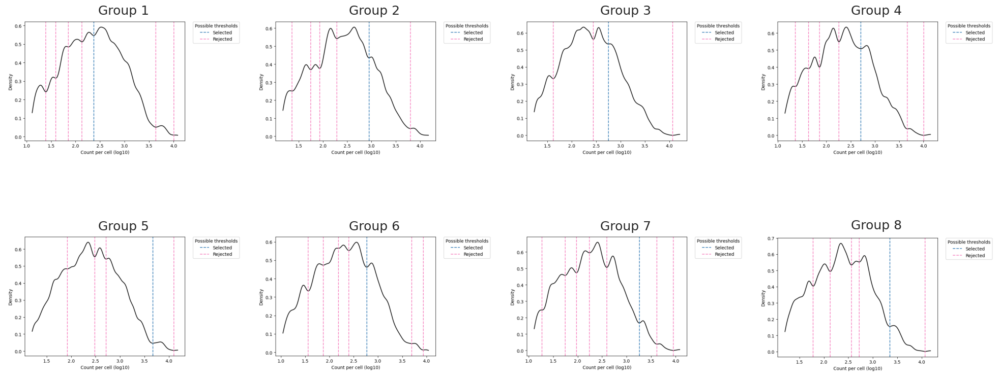

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# assuming `paths` already contains the sorted list of 8 image paths
n = len(AD_paths)

# determine rows/cols (e.g., 2 rows × 4 columns)
rows = 2
cols = (n + 1) // 2   # adjust if needed

plt.figure(figsize=(20, 10))

for i, p in enumerate(paths):
    img = mpimg.imread(p)
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(img)
    ax.axis('off')
    #ax.set_title(p.split("/")[-1], fontsize=10)
    ax.set_title(f"Group {i + 1}")

plt.tight_layout()
plt.show()


In [16]:
RPTR_paths = glob.glob(
    "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_*_RNA_RTBC_*/*barcode_count_density.png"
)
RPTR_paths = sorted(RPTR_paths)
RPTR_paths

['/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r1_RNA_RTBC_S25/umi_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r2_RNA_RTBC_S26/umi_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r3_RNA_RTBC_S27/umi_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r4_RNA_RTBC_S28/umi_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_plots_cell_barcode_count_density.png',
 '/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/TL4_umi_results_whitelist_concat/umi_r5_RNA_RTBC_S29/umi_r5_RNA_R

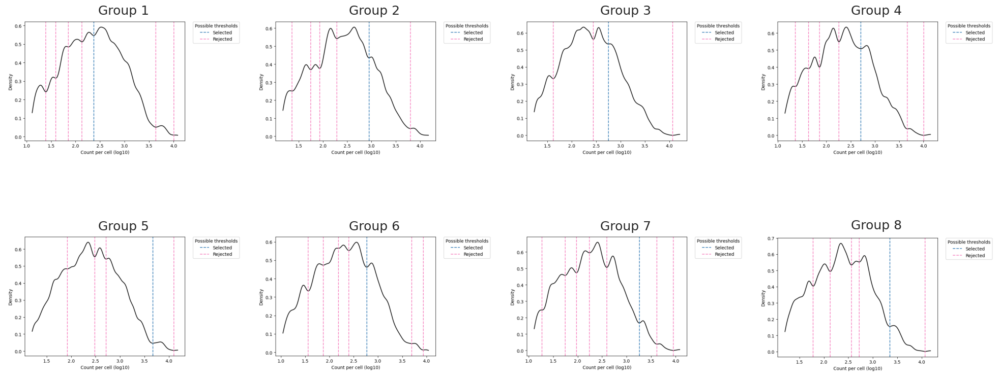

In [19]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# assuming `paths` already contains the sorted list of 8 image paths
n = len(RPTR_paths)

# determine rows/cols (e.g., 2 rows × 4 columns)
rows = 2
cols = (n + 1) // 2   # adjust if needed

plt.figure(figsize=(20, 10))

for i, p in enumerate(paths):
    img = mpimg.imread(p)
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(img)
    ax.axis('off')
    #ax.set_title(p.split("/")[-1], fontsize=10)
    ax.set_title(f"Group {i + 1}")

plt.tight_layout()
plt.show()
